In [ ]:
import numpy as np
import matplotlib.pyplot as plt

import librosa
import librosa.display
import matplotlib.pyplot as plt
from spleeter.audio.adapter import AudioAdapter

from IPython.display import Audio

: 

In [22]:
# Testfile path
file = '/data/fma_medium/037/037159.mp3'
#file = '/data/fma_medium/037/037859.mp3'

In [23]:
# File Loader
y, sr = librosa.load(file, sr=44100, mono=False, duration=30.0)
print(y.shape)
Audio(y, rate=sr)

(2, 1323000)


/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


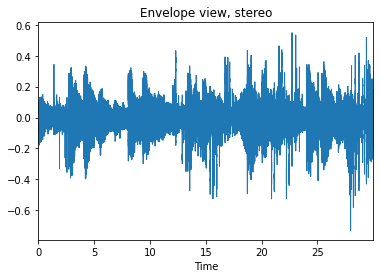

In [24]:
# Plot audio wave
fig, ax = plt.subplots(nrows=1, sharex=True)
librosa.display.waveplot(y, sr=44100, ax=ax)
ax.set(title='Envelope view, stereo')
ax.label_outer()

/usr/local/lib/python3.6/dist-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'basey' parameter of __init__() has been renamed 'base' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/usr/local/lib/python3.6/dist-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linthreshy' parameter of __init__() has been renamed 'linthresh' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)
/usr/local/lib/python3.6/dist-packages/librosa/display.py:974: MatplotlibDeprecationWarning: The 'linscaley' parameter of __init__() has been renamed 'linscale' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.
  scaler(mode, **kwargs)


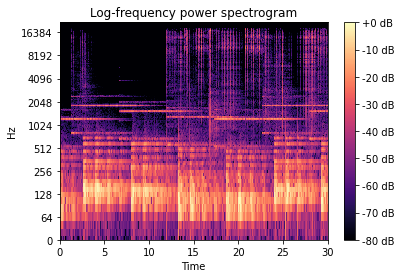

In [25]:
# Plot spectrogram
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)

hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(librosa.to_mono(y), hop_length=hop_length)), ref=np.max)
img = librosa.display.specshow(D, y_axis='log', sr=sr, hop_length=hop_length, x_axis='time', ax=ax)
ax.set(title='Log-frequency power spectrogram')
ax.label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")

In [37]:
y_2_semitones_up = np.stack((
    librosa.effects.pitch_shift(y[0], sr, n_steps=10),
    librosa.effects.pitch_shift(y[1], sr, n_steps=10)
))

Audio(y_2_semitones_up, rate=sr)

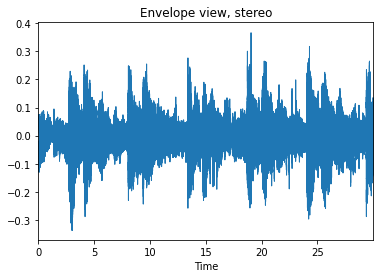

In [38]:
# Plot audio wave
fig, ax = plt.subplots(nrows=1, sharex=True)
librosa.display.waveplot(y_2_semitones_up, sr=44100, ax=ax)
ax.set(title='Envelope view, stereo')
ax.label_outer()

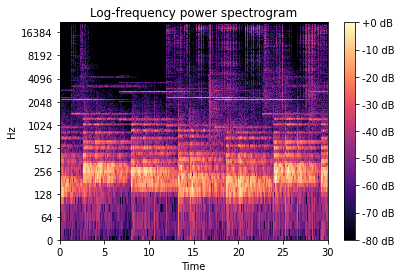

In [39]:
# Plot spectrogram
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)

hop_length = 1024
D = librosa.amplitude_to_db(np.abs(librosa.stft(librosa.to_mono(y_2_semitones_up), hop_length=hop_length)), ref=np.max)
img = librosa.display.specshow(D, y_axis='log', sr=sr, hop_length=hop_length, x_axis='time', ax=ax)
ax.set(title='Log-frequency power spectrogram')
ax.label_outer()
fig.colorbar(img, ax=ax, format="%+2.f dB")